# __<center><span style="color: orange"><u>ARTEFACT 1: SUPER-RESOLUTION GENERATIVE ADVERSARIAL NEURAL NETWORK (SRGANN)</u></span></center>__

<br>

TODO: A brief explanation what SRGAN is and does, and the methodology for the implemented algorithms.  
List a detailed explanation for the objectives Objectives for this artefact, and include bullet points on the explanation.

Objectives: A brief explanation of the oobjectives covered in this artefact (you can include bullet points for this explanation).

<br>

## **Task 1: Prepping Data and Loading Data**

1. Setup Configurations
2. Setup Working Paths
3. Downloading and Extracting the Dataset
4. Splitting the Dataset Using Cross-Validation, and Training Sub-Directories
5. Data Preparation and Transformation for SRGANN Training and Validation
6. Visualising Low Image Resolution, and High Image Resolution

---

<br>

### _1.1: Setup Configurations_

This section sets up the:
1. Environment
2. Importing Necessary Libraries
3. And providing information about the versions of key libraries being used.

Also, I am setting up the processor used for accomplishing this project, determining whether CUDA (GPU) is available for use and provides information about the available GPUs if present. This is useful for selecting the appropriate device for training `Neural Networks (NN)` based on availability.

In [ ]:
from google.colab import drive
drive.mount("/content/drive")  # Mount Google Drive to access datasets and other files

# -------------------------------------------- Import Necessary Libraries -------------------------------------------- #
import os               # For interacting with the operating system (e.g., file handling)
import torch            # Main PyTorch library
import random           # For generating random objects
import shutil           # For file operations (e.g., copying and removing files)
import zipfile          # For working with zip files, which is primarily used for extracting dataset files
import torch.nn as nn   # For building neural networks in PyTorch

from PIL import Image                           # Python Imaging Library for image processing
from tqdm import tqdm                           # For displaying progress bars during training
from torch.utils.data import DataLoader         # For loading data in batches
from torch.utils.data.dataset import Dataset    # For handling datasets
from torchvision.transforms import (
    Resize,       # For resizing images
    Compose,      # For composing several transforms together
    ToTensor,     # For converting images to PyTorch tensors
    RandomCrop,   # For random cropping of images
    ToPILImage,   # For converting tensors to PIL images
    CenterCrop    # For center cropping of images
)
# -------------------------------------------------------------------------------------------------------------------- #
# Printing the versions of important libraries:
print("\n" +
      f"OS Version:        {os.name}" + "\n" +
      f"Torch Version:     {torch.__version__}" + "\n" +
      f"PIL.Image Version: {Image.__version__}")

Mounted at /content/drive

OS Version:        posix
Torch Version:     2.3.1+cu121
PIL.Image Version: 9.4.0


In [ ]:
# Initialize the GPU (if avaliable) otherwise use CPU:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
check_device = torch.cuda.is_available()

if check_device:  # Check if CUDA is available.
    total_gpus = torch.cuda.device_count()

    # Get the number of GPUs:
    print("CUDA is available and GPU can be used." + "\n\n" +

          f"Total available GPUs: {total_gpus}" + "\n" +
          ('-' * 43))

    # Listing all GPUs:
    for gpu_number in range(total_gpus):
        print(f"GPU {gpu_number + 1}: {torch.cuda.get_device_name(gpu_number)}")
else:
    print("CUDA is not detected on this device..." + "\n\n" +

          "CPU:", True)

CUDA is available and GPU can be used.

Total available GPUs: 1
-------------------------------------------
GPU 1: NVIDIA L4


<br>

### *1.2: Setup Working Paths*

In [ ]:
project_home_path = "/content/drive/MyDrive/"
datasets_path = os.path.join(
    project_home_path, "Datasets/Artefact 1 - Super-Resolution Generative Adversarial Neural Network/"
)

print("Current Directory:" + "\n")
os.getcwd()

Current Directory:



'/content'

In [ ]:
os.chdir(project_home_path)

print("Changing current working directory to Projet Home Directory:" + "\n")
os.getcwd()

Changing current working directory to Projet Home Directory:



'/content/drive/MyDrive'

In [ ]:
os.chdir(datasets_path)

print("Changing Projet Home Directory to Datasets Directory:" + "\n")
os.getcwd()

Changing Projet Home Directory to Datasets Directory:



'/content/drive/MyDrive/Datasets/Artefact 1 - Super-Resolution Generative Adversarial Neural Network'

<br>

### *1.3: Downloading and Extracting the Dataset*

This block ensures that the dataset is available for use, downloading it from Kaggle if necessary, and prepares it for further processing.

Ensure that the `Kaggle API` is set up correctly and the Kaggle token file is placed in the specified path for the download command to work.

In [ ]:
# ----------------------------- Checking Dataset Existence and Downloading if Necessary ------------------------------ #
srgann_dataset_folder = "Image Super Resolution - Unsplash"
srgann_dataset_downloaded_zipped_file = "image-super-resolution-from-unsplash.zip"

# Walk through the dataset folder path to check for the existence of the dataset files:
for directory_paths, directory_names, file_names in os.walk(datasets_path):
    # Check if the zipped dataset file and the dataset directory exist:
    if (srgann_dataset_downloaded_zipped_file in file_names) and (srgann_dataset_folder in directory_names):
        print(f"The Downloaded 'Dataset Zipped File: {srgann_dataset_downloaded_zipped_file}' and the 'Dataset " +
              f"Directory: {srgann_dataset_folder}' exist in this directory." + "\n\n" +

              f"PATH: {datasets_path}" + "\n\n\n" +


              "Displaying contents in Datasets Directory:" + "\n")

        %ls -l  # List the contents of the current directory
        break
else:
    print(f"The Downloaded 'Dataset Zipped File: {srgann_dataset_downloaded_zipped_file}' and the 'Dataset " +
          f"Directory: {srgann_dataset_folder}' does not exist in this directory." + "\n\n" +

          f"PATH: {datasets_path}" + "\n" +
          ("-----" * 45))

    # Instructions to obtain the Kaggle API token for dataset download:
    # (1): Go to kaggle.com => settings => account => API => Create New Token and save to the directory where you want
    #      to have your dataset downloaded.
    #
    # (2): Set the KAGGLE_CONFIG_DIR variable to the token file, this is the Path to where the kaggle dataset is being
    #      downloaded.
    os.environ["KAGGLE_CONFIG_DIR"] = datasets_path

    print("Commencing Dataset Download..." + "\n")

    # (3): Download the dataset from Kaggle using the Kaggle API command:
    !kaggle datasets download -d quadeer15sh/image-super-resolution-from-unsplash --force

    print("-----" * 45)

    # Unzip and extract the downloaded dataset.zip file:
    with zipfile.ZipFile(srgann_dataset_downloaded_zipped_file, 'r') as zip_ref:
        srgann_dataset_zip_files = zip_ref.infolist()

        with tqdm(total=len(srgann_dataset_zip_files), desc="Extracting Dataset Files") as progress_bar:
            for srgann_dataset_zip_file in srgann_dataset_zip_files:
                zip_ref.extract(srgann_dataset_zip_file, datasets_path)
                progress_bar.update(1)

    print("\n\n" + "Displaying contents in Datasets Directory:" + "\n")
    %ls -l  # List all the contents of the current directory

The Downloaded 'Dataset Zipped File: image-super-resolution-from-unsplash.zip' and the 'Dataset Directory: Image Super Resolution - Unsplash' exist in this directory.

PATH: /content/drive/MyDrive/Datasets/Artefact 1 - Super-Resolution Generative Adversarial Neural Network/


Displaying contents in Datasets Directory:

total 1016596
drwx------ 2 root root       4096 Jul  2 19:23 'Discriminator Weights'/
drwx------ 2 root root       4096 Jul  9 22:25  Generated_Images/
drwx------ 2 root root       4096 Jul  2 19:23 'Generator Weights'/
-rw------- 1 root root 1040966612 Jun 27 01:18  image-super-resolution-from-unsplash.zip
drwx------ 2 root root       4096 Jul  2 19:23 'Image Super Resolution - Unsplash'/
drwx------ 2 root root       4096 Jul  2 20:37  models_saved/
drwx------ 2 root root       4096 Jul  2 20:32  performance/
-rw------- 1 root root        200 Jul  9 22:28  training_results_epoch_2.pkl
-rw------- 1 root root        308 Jul  9 22:30  training_results_epoch_4.pkl
-rw------

In [ ]:
srgann_dataset_path = os.path.join(datasets_path, "Image Super Resolution - Unsplash/")

os.chdir(srgann_dataset_path)

print("Changing Datasets Directory to SRGANN Dataset Directory:" + "\n")
os.getcwd()

Changing Datasets Directory to SRGANN Dataset Directory:



'/content/drive/MyDrive/Datasets/Artefact 1 - Super-Resolution Generative Adversarial Neural Network/Image Super Resolution - Unsplash'

In [ ]:
print("Displaying contents in SRGANN Dataset Directory:" + "\n")
%ls -l

high_res_folder_renamed = ["high res", "High Resolution Images"]
low_res_folder_renamed = ["low res", "Low Resolution Images"]

try:
    # Check if the directories exist before renaming
    if os.path.exists(high_res_folder_renamed[0]) and os.path.exists(low_res_folder_renamed[0]):
        # Rename the High-Resolution Images and Low-Resolution Image Folders:
        os.rename(high_res_folder_renamed[0], high_res_folder_renamed[1])
        os.rename(low_res_folder_renamed[0], low_res_folder_renamed[1])
    else:
        print("\n\n" + f"The 'Directories: {high_res_folder_renamed[0]} and/or {low_res_folder_renamed[0]}' do not " +
              "exist in:" + "\n\n"

              f"PATH: {srgann_dataset_path}")
except FileExistsError:
    print("\n\n" + f"The 'Directory: {high_res_folder_renamed[0]} and {low_res_folder_renamed[0]}' and the 'Dataset " +
          "does not exist in:" + "\n\n" +

          f"PATH: {srgann_dataset_path}" + "\n")
except PermissionError:
    print(f"Permission Denied: Unable to rename the 'Directory: " +
          f"{high_res_folder_renamed[0]} and {low_res_folder_renamed[0]}'")
except Exception as e:
    print("Oops, there seems to be an issue with the operation in the current directory." + "\n\n" +

          f"Error: {e}")

Displaying contents in SRGANN Dataset Directory:

total 26338
-rw------- 1 root root  2982727 Jul  3 00:06  generator_model.pt
drwx------ 2 root root     4096 Jul  2 19:23 'high res'/
-rw------- 1 root root    72378 Jun 27 01:18  image_data.csv
drwx------ 2 root root     4096 Jul  2 19:23 'low res'/
-rw------- 1 root root 20894488 Jul  2 22:10  path_to_disc.pth
-rw------- 1 root root  2974595 Jul  2 22:10  path_to_gen.pth
drwx------ 2 root root     4096 Jul  9 10:48  Testing/
drwx------ 2 root root     4096 Jul  9 11:44  Testing1/
drwx------ 2 root root     4096 Jul  2 19:23 'Testing Folder'/
drwx------ 2 root root     4096 Jul  9 10:48  Training/
drwx------ 2 root root     4096 Jul  9 11:44  Training1/
drwx------ 2 root root     4096 Jul  2 19:23 'Training Folder'/
drwx------ 2 root root     4096 Jul  9 10:48  Validation/
drwx------ 2 root root     4096 Jul  9 11:44  Validation1/
drwx------ 2 root root     4096 Jul  2 19:23 'Validation Folder'/


In [ ]:
# Defined folder names for different types of Images and Model Weights:
folders = [
    "Training Images",
    "Validation Images",
    "Testing Images",
    "Generated Images",
    "Weights Checkpoint",
    "Weights Checkpoint/Generator Weights",
    "Weights Checkpoint/Discriminator Weights"
]

# Create each directory if it doesn't exist:
for dir in folders:
    os.makedirs(dir, exist_ok=True)

print("Displaying contents in SRGANN Dataset Directory:" + "\n")
%ls -l

Displaying contents in SRGANN Dataset Directory:

total 26358
drwx------ 2 root root     4096 Jul 22 16:10 'Generated Images'/
-rw------- 1 root root  2982727 Jul  3 00:06  generator_model.pt
drwx------ 2 root root     4096 Jul 22 16:10 'High Resolution Images'/
-rw------- 1 root root    72378 Jun 27 01:18  image_data.csv
drwx------ 2 root root     4096 Jul 22 16:10 'Low Resolution Images'/
-rw------- 1 root root 20894488 Jul  2 22:10  path_to_disc.pth
-rw------- 1 root root  2974595 Jul  2 22:10  path_to_gen.pth
drwx------ 2 root root     4096 Jul  9 10:48  Testing/
drwx------ 2 root root     4096 Jul  9 11:44  Testing1/
drwx------ 2 root root     4096 Jul  2 19:23 'Testing Folder'/
drwx------ 2 root root     4096 Jul 22 16:10 'Testing Images'/
drwx------ 2 root root     4096 Jul  9 10:48  Training/
drwx------ 2 root root     4096 Jul  9 11:44  Training1/
drwx------ 2 root root     4096 Jul  2 19:23 'Training Folder'/
drwx------ 2 root root     4096 Jul 22 16:10 'Training Images'/
drw

<br>

### *1.4: Splitting the Dataset Using Cross-Validation, and Training Sub-Directories*

This block sets up various configurations and hyper-parameters for training the Super-Resolution Generative Adversarial Network (SRGANN), including:
- Model Paths
- Training Parameters
- Image Resolutions
- Dataset Paths.

These settings will guide the training and evaluation process of the GANN models. And is crucial for preparing the dataset by splitting it into `Training`, `Validation`, and `Testing` sets, ensuring a successful **Cross-Validation** perofrmance, effectively.

In [ ]:
# -------------------------------------------------- CONFIGURATIONS -------------------------------------------------- #
# Model Weights, generated after training a GANN:
#   1. Generator
#   2. Discriminator
CHECKPOINT_WEIGHTS = os.path.join(srgann_dataset_path, "Weights Checkpoint/")
CHECKPOINT_GENERATOR_WEIGHTS = os.path.join(CHECKPOINT_WEIGHTS, "Generator Weights/")
CHECKPOINT_DISCRIMINATOR_WEIGHTS = os.path.join(CHECKPOINT_WEIGHTS, "Discriminator Weights/")
# -------------------------------------------------------------------------------------------------------------------- #
# Boolean indicating whether to load a pre-trained model (True) or to train a new model (False).
LOAD_MODEL = False                     # Boolean indicating whether to load a pre-trained model or to train a new model
SAVE_MODEL = True                      # Boolean indicating whether to save the model after training
CROP_SIZE = 224
BATCH_SIZE = [5, 1]                                 # Initializing the bach size
UPSCALE_FACTORS = 4
LEARNING_RATE = 1e-4                                # Initializing the learning rate.
NUMBER_OF_WORKERS = 2                               # Recommended 4 - Number of worker processes for data loading
LAMBDA_GRADIENT_PENALTY = 10                        # Gradient penalty coefficient for the Wasserstein GAN.
NUMBER_OF_EPOCHS = [25, 50, 100, 355, 500, 1000]    # Initializing the number of epochs.
# -------------------------------------------------------------------------------------------------------------------- #
# This is the Parent Folder Path for performing Cross-Validation on the dataset images:
high_resolution_image_path = os.path.join(srgann_dataset_path, "High Resolution Images/")
generated_images_path = os.path.join(srgann_dataset_path, "Generated Images/")
training_folder_path = os.path.join(srgann_dataset_path, "Training Images/")
validation_folder_path = os.path.join(srgann_dataset_path, "Validation Images/")
testing_folder_path = os.path.join(srgann_dataset_path, "Testing Images/")
training_ratio = 0.8    # 80% for training
validation_ratio = 0.1  # 10% for validation
testing_ratio = 0.1     # 10% for testing

In [ ]:
image_files = [  # List all image files in the source folder:
    files for files in os.listdir(high_resolution_image_path) if files.lower().endswith(
        (".png", ".jpg", ".jpeg", ".bmp")
    )
]
total_images = len(image_files)  # Total number of images in the source folder

# Shuffle the image list randomly:
random.shuffle(image_files)

# Calculate the number of images for each split:
training_split = int(total_images * training_ratio)
validation_split = int(total_images * validation_ratio)
testing_split = total_images - training_split - validation_split

# Copy images to their respective subdirectories:
for i, image_file in enumerate(image_files):
    if i < training_split:
        shutil.copy(
            os.path.join(high_resolution_image_path, image_file),
            os.path.join(srgann_dataset_path, training_folder_path, image_file)
        )
    elif i < training_split + validation_split:
        shutil.copy(
            os.path.join(high_resolution_image_path, image_file),
            os.path.join(srgann_dataset_path, validation_folder_path, image_file)
        )
    else:
        shutil.copy(
            os.path.join(high_resolution_image_path, image_file),
            os.path.join(srgann_dataset_path, testing_folder_path, image_file)
        )

print(f"A Total Number of {total_images:,} Images are in the SRGANN Dataset." + "\n\n" +

      "Total Images on Cross-Validated Dataset".center(67, '-') + "\n\n" +

      f"Total Number of Training Images:   {training_split:,}" + "\n" +
      f"Total Number of Testing Images:    {testing_split}" + "\n" +
      f"Total Number of Validation Images: {validation_split}" + "\n" +
       ('-' * 67))

A Total Number of 1,004 Images are in the SRGANN Dataset.

--------------Total Images on Cross-Validated Dataset--------------

Total Number of Training Images:   803
Total Number of Testing Images:    101
Total Number of Validation Images: 100
-------------------------------------------------------------------


<br>

### *1.5: Data Preparation and Transformation for SRGANN Training and Validation*

In [ ]:
def calculate_valid_crop_size(crop_size, upscale_factor):
    """This function calculates a valid crop size for the input images to ensure that the cropped size is divisible by
the upscale factor.

Parameters:
    crop_size (int): The initial size of the crop.
    upscale_factor (int): The factor by which the image will be upscaled.

Returns: An integer representing the largest size less than or equal to crop_size that is divisible by upscale_factor.
    """
    return crop_size - (crop_size % upscale_factor)


# Example Usage: Let's assume we have an initial crop size of 128 and an upscale factor of 4. The function will return
# the largest size less than or equal to 128 that is divisible by 4, which is 128 in this case.
example_crop_size = CROP_SIZE
example_upscale_factor = UPSCALE_FACTORS
valid_crop_size = calculate_valid_crop_size(example_crop_size, example_upscale_factor)

print(f"Image Crop Size: {example_crop_size}" + "\n" +
      f"Upscale Factor:  {example_upscale_factor}" + "\n" +
       ('-' * 27) + "\n" +
      f"Valid Crop Size: {valid_crop_size}")

Image Crop Size: 224
Upscale Factor:  4
---------------------------
Valid Crop Size: 224


In [ ]:
def train_and_transform_high_resolution_images(crop_size):
    """his function defines a set of transformations to be applied to high-resolution images during training. It crops
the images to a specified size and then converts them to tensors.

Parameters:
    crop_size (int): The size to which the image should be randomly cropped.

Returns: A Compose object containing the transformations
    """
    return Compose(
        [
            RandomCrop(crop_size),
            ToTensor(),
        ]
    )


# Example Usage: Let's assume we want to apply the transformations to High-Resolution Images with a crop size of 128.
# We create an instance of the transformations:
tthri = train_and_transform_high_resolution_images(example_crop_size)

print("Transformations applied to High-Resolution Images during Training:")
print(tthri)

Transformations applied to High-Resolution Images during Training:
Compose(
    RandomCrop(size=(224, 224), padding=None)
    ToTensor()
)


In [ ]:
def train_and_transform_low_resolution_images(crop_size, upscale_factor):
    """This function defines a set of transformations to be applied to images to create low-resolution versions of them.
This allows the use of high-resolution images to generate corresponding low-resolution images on-the-fly, which can be
used as inputs for the SRGAN.

Parameters:
    crop_size (int): The size to which the image should be randomly cropped.
    upscale_factor (int): The factor by which the image resolution will be reduced.

Returns: A Compose object containing the transformations.
    """
    return Compose(  # bicubic -> smooth image when resize
        [
            ToPILImage(),
            Resize(crop_size // upscale_factor, interpolation=Image.BICUBIC),
            ToTensor()
        ]
    )


# Example Usage: Let's assume we want to apply the transformations to create Low-Resolution Images with a crop size of
# 128 and an upscale factor of 4. We create an instance of the transformations:
ttlri = train_and_transform_low_resolution_images(example_crop_size, example_upscale_factor)

print("Transformations applied to create Low-Resolution Images during Training:")
print(ttlri)

Transformations applied to create Low-Resolution Images during Training:
Compose(
    ToPILImage()
    Resize(size=56, interpolation=bicubic, max_size=None, antialias=True)
    ToTensor()
)


In [ ]:
def display_transformations():
    """This function defines a set of transformations to be applied to images for display purposes during model training.
It prepares the images for visualization by converting them to PIL images, resizing them to a fixed size, cropping them
to a square, and converting them back to tensors.

Returns: A Compose object containing the transformations.
    """
    return Compose(
        [
            ToPILImage(),
            Resize(400),
            CenterCrop(400),
            ToTensor()
        ]
    )


dt = display_transformations()
print("Transformations applied to images for display during model training:")
print(dt)

Transformations applied to images for display during model training:
Compose(
    ToPILImage()
    Resize(size=400, interpolation=bilinear, max_size=None, antialias=True)
    CenterCrop(size=(400, 400))
    ToTensor()
)


In [ ]:
class TrainDatasetFromFolder(Dataset):
    """This class represents a PyTorch dataset for training the SRGAN model. Each instance of this dataset returns a
low-resolution (LR) image and its corresponding high-resolution (HR) image.

Attributes:
    image_filenames (list): A list containing the file paths of all images in the dataset.
    hr_transform (Compose): A set of transformations to be applied to HR images.
    lr_transform (Compose): A set of transformations to be applied to LR images.
    """
    def __init__(self, dataset_directory, crop_size, upscale_factor):
        """Initializes the dataset instance.

    Parameters:
        dataset_directory (str): The directory containing the dataset images.
        crop_size (int): The size to which the images should be cropped.
        upscale_factor (int): The factor by which the images will be upscaled to generate HR images.
        """
        super(TrainDatasetFromFolder, self).__init__()

        self.image_filenames = [os.path.join(dataset_directory, x) for x in os.listdir(dataset_directory)]
        self.crop_size = calculate_valid_crop_size(crop_size, upscale_factor)
        self.high_resolution_transformation = train_and_transform_high_resolution_images(crop_size)
        self.low_resolution_transformation = train_and_transform_low_resolution_images(crop_size, upscale_factor)

    def __getitem__(self, index):
        """Retrieves an low-resolution images and its corresponding high-resolution images from the dataset.

    Parameters:
        index (int): The index of the image to retrieve.

    Returns:
        tuple: A tuple containing the low-resolution image and the high-resolution image.
        """
        high_resolution_image = self.high_resolution_transformation(Image.open(self.image_filenames[index]))
        low_resolution_image = self.low_resolution_transformation(high_resolution_image)

        return low_resolution_image, high_resolution_image

    def __len__(self):
        """Returns the total number of images in the dataset.

    Returns:
        int: The number of images in the dataset.
        """
        return len(self.image_filenames)

In [ ]:
class ValidateDatasetFromFolder(Dataset):
    """This class represents a custom PyTorch dataset for validation. Each instance of the dataset returns a
low-resolution image, a scaled version of the low-resolution image, and the corresponding high-resolution image.

Attributes:
    upscale_factor (int): The factor by which the images will be upscaled.
    image_filenames (list): A list containing the file paths of all images in the dataset.
    """
    def __init__(self, dataset_directory, upscale_factor):
        """ Initializes the dataset instance.
    Parameters:
        dataset_directory (str): The directory containing the validation dataset images.
        upscale_factor (int): The factor by which the images will be upscaled.
        """
        super(ValidateDatasetFromFolder, self).__init__()

        self.upscale_factor = upscale_factor
        self.image_filenames = [os.path.join(dataset_directory, x) for x in os.listdir(dataset_directory)]

    def __getitem__(self, index):
        """Retrieves a low-resolution image, a scaled version of the low-resolution image, and the corresponding
    high-resolution image from the dataset.

    Parameters:
        index (int): The index of the image to retrieve.

    Returns: A tuple containing the low-resolution image, the scaled version of the low-resolution image, and the
             high-resolution image, all converted to tensors.
        """
        high_resolution_image = Image.open(self.image_filenames[index])
        image_width, image_height = high_resolution_image.size
        crop_size = calculate_valid_crop_size(min(image_width, image_height), self.upscale_factor)
        low_resolution_scale = Resize(crop_size // self.upscale_factor, interpolation=Image.BICUBIC)
        high_resolution_scale = Resize(crop_size, interpolation=Image.BICUBIC)
        high_resolution_image = CenterCrop(crop_size)(high_resolution_image)
        low_resolution_image = low_resolution_scale(high_resolution_image)
        hr_restore_img = high_resolution_scale(low_resolution_image)

        return ToTensor()(low_resolution_image), ToTensor()(hr_restore_img), ToTensor()(high_resolution_image)

    def __len__(self):
        """Returns the total number of images in the dataset.

    Returns: The number of images in the dataset.
        """
        return len(self.image_filenames)

In [ ]:
# Create instance of the training datasets:
training_dataset = TrainDatasetFromFolder(
    dataset_directory=training_folder_path,
    crop_size=CROP_SIZE,
    upscale_factor=UPSCALE_FACTORS
)

# Create instances of the validation datasets:
validation_dataset = ValidateDatasetFromFolder(
    dataset_directory= validation_folder_path,
    upscale_factor=UPSCALE_FACTORS
)

# Create instances of the testing datasets:
testing_dataset = ValidateDatasetFromFolder(
    dataset_directory= testing_folder_path,
    upscale_factor=UPSCALE_FACTORS
)

# Create DataLoaders for training and validation datasets:
training_loader = DataLoader(training_dataset, batch_size=BATCH_SIZE[0], shuffle=True, num_workers=NUMBER_OF_WORKERS)
validation_loader = DataLoader(validation_dataset, batch_size=BATCH_SIZE[1], shuffle=True,
                               num_workers=NUMBER_OF_WORKERS)
testing_loader = DataLoader(testing_dataset, batch_size=BATCH_SIZE[1], shuffle=True, num_workers=NUMBER_OF_WORKERS)

<br>

### *1.6: Visualising Low Image Resolution, and High Image Resolution*

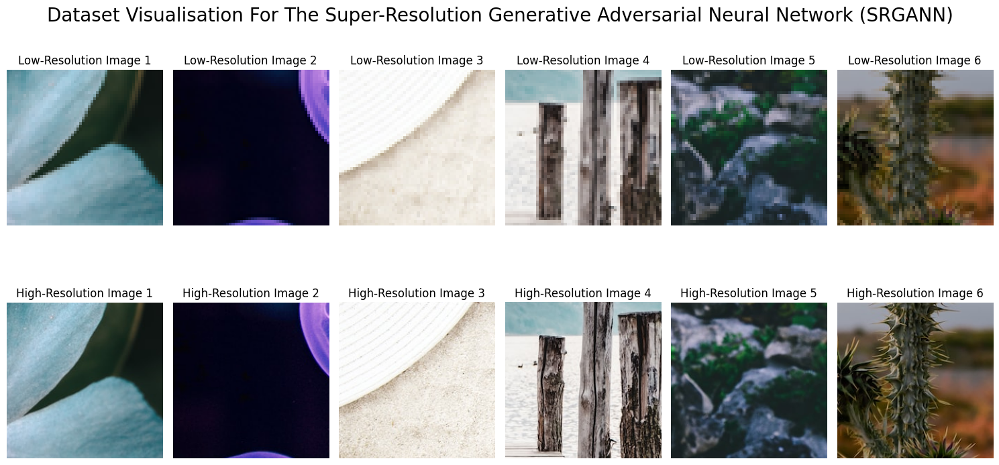

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline


display_total_images = 6  # Number of images to display
plot_title = "Dataset Visualisation For The Super-Resolution Generative Adversarial Neural Network (SRGANN)"

# Create a figureure with 2 rows and display_total_images columns
figure, axis = plt.subplots(2, display_total_images, figsize=(15, 8))

# Loop to display the images
for i in range(display_total_images):
    low_resolution_image, high_resolution_image = training_dataset[i]

    # Convert the tensors to numpy arrays and transpose the dimensions for visualization
    low_resolution_image_np = low_resolution_image.numpy().transpose((1, 2, 0))
    high_resolution_image_np = high_resolution_image.numpy().transpose((1, 2, 0))

    # Show the low-resolution image in the first row
    axis[0, i].imshow(low_resolution_image_np)
    axis[0, i].set_title(f"Low-Resolution Image {i + 1}")
    axis[0, i].axis("off")

    # Show the high-resolution image in the second row
    axis[1, i].imshow(high_resolution_image_np)
    axis[1, i].set_title(f"High-Resolution Image {i + 1}")
    axis[1, i].axis("off")

plt.tight_layout()                      # Adjust the layout
plt.suptitle(plot_title, fontsize=20)   # Set a title for the entire figure
plt.show()                              # Display the figureure

<br>

## **2. Building The Model**
The following network will be the implementation for the SRGANN proposed by SRGAN Research Paper.
![SRGANN Image Example](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-19_at_11.13.45_AM_zsF2pa7.png)

Objectives:
1. Setup Networks
2. Setup Loss Function

---

<br>

### *2.1 Setup Networks*

In [ ]:
print("Downloading Module: Piqa".center(167, '-'))

!pip install piqa

print("Successfully Downloaded Module: Piqa".center(167, '-') + "\n")

import piqa                             # Importing Piqa for perceptual image quality assessment
import math                             # Importing math for mathematical functions
import pickle                           # Importing pickle for object serialization
import warnings
import numpy as np                      # Importing numpy for numerical operations
import pandas as pd                     # Importing pandas for data manipulation and analysis
import torch.optim as optim             # For optimization algorithms in PyTorch.
import torch.nn.functional as F         # For functional API in PyTorch.
import torchvision.utils as utils       # For utilities from the torchvision library.

warnings.filterwarnings("ignore")

from torch.autograd import Variable     # Used to wrap tensors in a Variable for automatic differentiation.
from torchvision.models import (vgg16, VGG16_Weights)
from torchsummary import summary


print(f"Piqa Version:   {piqa.__version__}" + "\n" +
      f"Numpy Version:  {np.__version__}" + "\n" +
      f"Pandas Version: {pd.__version__}")

------------------------------------------------------------------------Downloading Module: Piqa-----------------------------------------------------------------------
------------------------------------------------------------------Successfully Downloaded Module: Piqa-----------------------------------------------------------------

Piqa Version:   1.3.2
Numpy Version:  1.25.2
Pandas Version: 2.0.3


In [ ]:
class ResidualBlock(nn.Module):
    """This class defines a Residual Block, which applies two Convolutional Layers with Batch Normalization and a PReLU
activation function, followed by an addition of the Input (Skip Connection) to the Output of the Second Convolutional
layer.

Methods:
    ResidualBlockForwardProcess (input_data): Applies the forward process for the Residual Block.

Attributes:
    covolutional_block1 (nn.Conv2d): The first convolutional layer.
    batch_normalisation1 (nn.BatchNorm2d): Batch normalization for the first convolutional layer.
    prelu (nn.PReLU): PReLU activation function.
    covolutional_block2 (nn.Conv2d): The second convolutional layer.
    batch_normalisation2 (nn.BatchNorm2d): Batch normalization for the second convolutional layer.
    """
    def __init__(self, channels):
        """Initialize the Residual Block with specified number of channels.

    Parameters:
        channels (int): The number of channels in the input and output feature maps.
        """
        super(ResidualBlock, self).__init__()

        # First Convolutional Layer with Batch Normalization and PReLU Activation:
        self.covolutional_block1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.batch_normalisation1 = nn.BatchNorm2d(channels)
        self.prelu = nn.PReLU()

        # Second Convolutional Layer with Batch Normalization:
        self.covolutional_block2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.batch_normalisation2 = nn.BatchNorm2d(channels)

    def forward(self, input_data):
        """Applies the forward process for the Residual Block.

    Parameters:
        input_data (Tensor): The input tensor.

    Returns:
        Tensor: The output tensor with the residual added.
        """
        # First Convolutional Layer:
        residual_block = self.covolutional_block1(input_data)
        residual_block = self.batch_normalisation1(residual_block)
        residual_block = self.prelu(residual_block)

        # Second Convolutional Layer:
        residual_block = self.covolutional_block2(residual_block)
        residual_block = self.batch_normalisation2(residual_block)

        # Add the Input (Skip Connection) to the Output of the Cecond Convolutional Layer:
        return input_data + residual_block

In [ ]:
class UpSampleBlock(nn.Module):
    """The Class: UpSampleBlock defines an Upsampling Block used in neural networks to increase the spatial resolution
of input feature maps. It consists of a Convolutional Layer, a Pixel Shuffle Layer, and a PReLU Activation Function.

Methods:
    UpSampleBlockForwardProcess (input_data): Applies the forward process for the UpSampleBlock.

Attributes:
    convolutional_block (nn.Conv2d): Convolutional layer to increase the number of channels.
    pixel_shuffle (nn.PixelShuffle): Layer to upscale the spatial dimensions.
    prelu (nn.PReLU): Activation function for introducing non-linearity.
    """
    def __init__(self, input_channels, up_scale):
        """Initializes the UpSampleBlock with the specified number of input channels and upscaling factor.

    Parameters:
        input_channels (int): The number of channels in the input feature maps.
        up_scale (int): The factor by which to upscale the input feature maps.
        """
        super(UpSampleBlock, self).__init__()

        # Convolutional Layer to increase the Number of Channels:
        self.convolutional_block = nn.Conv2d(input_channels, (input_channels * up_scale ** 2), kernel_size=3, padding=1)

        # (Reference: https://github.com/pytorch/examples/blob/main/super_resolution/model.py)
        self.pixel_shuffle = nn.PixelShuffle(up_scale)  # Pixel Shuffle Layer to Upscale the spatial dimensions.
        self.prelu = nn.PReLU()                         # PReLU Activation Function for introducing non-linearity.

    def forward(self, input_data):
        """Forward pass of the UpSampleBlock.

    Parameters:
        input_data (Tensor): The input tensor.

    Returns:
        Tensor: The upscaled output tensor.
        """
        input_data = self.convolutional_block(input_data)
        input_data = self.pixel_shuffle(input_data)
        input_data = self.prelu(input_data)

        return input_data

In [ ]:
class Generator(nn.Module):
    """Defines the Generator Neural Network for Super-Resolution Generative Adversarial Neural Network (SRGANN).

Attributes:
    block1-7 (nn.Sequential/ResidualBlock): Sequential blocks for initial feature extraction and residual learning.
    block8 (nn.Sequential): Sequential block for upsampling and reconstruction.
    """
    def __init__(self, scale_factor):
        """Initializes the Generator with the specified upscaling factor.

    Parameters:
        scale_factor (int): The factor by which the image will be upscaled.
        """
        upsample_block_num = int(math.log(scale_factor, 2))

        super(Generator, self).__init__()

        # Initial Convolutional Block:
        self.block1 = nn.Sequential(nn.Conv2d(3, 64, kernel_size=9, padding=4), nn.PReLU())

        # Residual Block:
        self.block2 = ResidualBlock(64)
        self.block3 = ResidualBlock(64)
        self.block4 = ResidualBlock(64)
        self.block5 = ResidualBlock(64)
        self.block6 = ResidualBlock(64)

        # Intermediate Convolutional Block:
        self.block7 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, padding=1), nn.BatchNorm2d(64))

        # Upsampling Blocks:
        block8 = [UpSampleBlock(64, 2) for _ in range(upsample_block_num)]

        block8.append(nn.Conv2d(64, 3, kernel_size=9, padding=4))

        self.block8 = nn.Sequential(*block8)

    def forward(self, input_data):
        """Forward process of the Generator Neural Network.

    Parameters:
        input_data (Tensor): Input tensor representing low-resolution image.

    Returns:
        Tensor: Output tensor representing high-resolution image.
        """
        block1 = self.block1(input_data)
        block2 = self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)
        block6 = self.block6(block5)
        block7 = self.block7(block6)
        block8 = self.block8(block1 + block7)

        return (torch.tanh(block8) + 1) / 2

In [ ]:
# Initialize the model with the desired scale factor
scale_factor = 4  # For example, change this according to your needs
model = Generator(scale_factor).to(DEVICE)

# Print summaries
summary(model, (3, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]          15,616
             PReLU-2           [-1, 64, 64, 64]               1
            Conv2d-3           [-1, 64, 64, 64]          36,928
       BatchNorm2d-4           [-1, 64, 64, 64]             128
             PReLU-5           [-1, 64, 64, 64]               1
            Conv2d-6           [-1, 64, 64, 64]          36,928
       BatchNorm2d-7           [-1, 64, 64, 64]             128
     ResidualBlock-8           [-1, 64, 64, 64]               0
            Conv2d-9           [-1, 64, 64, 64]          36,928
      BatchNorm2d-10           [-1, 64, 64, 64]             128
            PReLU-11           [-1, 64, 64, 64]               1
           Conv2d-12           [-1, 64, 64, 64]          36,928
      BatchNorm2d-13           [-1, 64, 64, 64]             128
    ResidualBlock-14           [-1, 64,

In [ ]:
class Discriminator(nn.Module):
    """Defines the Discriminator Neural Network for Super-Resolution Generative Adversarial Neural Network (SRGANN).

Attributes:
    net (nn.Sequential): Sequential Neural Network Layers for feature extraction and classification.
    """

    def __init__(self):
        """Initializes the Discriminator Network."""
        super(Discriminator, self).__init__()

        self.net = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, 512, kernel_size=3, stride=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(512, 1024, kernel_size=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(1024, 1, kernel_size=1)
        )

    def forward(self, input_data):
        """Forward process of the Discriminator Network.

    Parameters:
        input_data (Tensor): Input tensor representing images.

    Returns:
        Tensor: Output tensor representing the probability of input being real (1) or fake (0).
        """
        batch_size = input_data.size(0)

        return torch.sigmoid(self.net(input_data).view(batch_size))

In [ ]:
# Initialize the model
model = Discriminator().to(DEVICE)

# Print the summary of the model
summary(model, (3, 64, 64))  # Example input size (channels, height, width)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,792
         LeakyReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3           [-1, 64, 32, 32]          36,928
       BatchNorm2d-4           [-1, 64, 32, 32]             128
         LeakyReLU-5           [-1, 64, 32, 32]               0
            Conv2d-6          [-1, 128, 32, 32]          73,856
       BatchNorm2d-7          [-1, 128, 32, 32]             256
         LeakyReLU-8          [-1, 128, 32, 32]               0
            Conv2d-9          [-1, 128, 16, 16]         147,584
      BatchNorm2d-10          [-1, 128, 16, 16]             256
        LeakyReLU-11          [-1, 128, 16, 16]               0
           Conv2d-12          [-1, 256, 16, 16]         295,168
      BatchNorm2d-13          [-1, 256, 16, 16]             512
        LeakyReLU-14          [-1, 256,

<br>

### *2.2: Setup Loss Function*

In [ ]:
class GeneratorLoss(nn.Module):
    """Defines the Loss Function for the Generator in the SRGANN model.

Attributes:
    loss_network (nn.Sequential): Pre-trained VGG16 network for perceptual loss.
    mse_loss (nn.MSELoss): Mean Squared Error (MSE) loss function.
    l2_loss (nn.MSELoss): L2 loss function.
    """

    def __init__(self):
        """Initializes the GeneratorLoss."""
        super(GeneratorLoss, self).__init__()

        vgg = vgg16(weights=VGG16_Weights.DEFAULT).features[:31].eval()  # Load pre-trained VGG16 model

        for param in vgg.parameters():  # Freeze VGG parameters
            param.requires_grad = False

        self.loss_network = vgg
        self.mse_loss = nn.MSELoss()  # Mean Squared Error Loss
        self.l2_loss = nn.MSELoss()   # L2 Loss (for regularization)

    def forward(self, output_labels, output_images, target_images):
        """Computes the loss for the Generator.

    Parameters:
        output_labels (Tensor): Output labels from the discriminator (not used directly in this function).
        output_images (Tensor): Generated images by the Generator.
        target_images (Tensor): Target high-resolution images.

    Returns:
        Tensor: Combined loss value comprising adversarial, perceptual, image, and L2 losses.
        """
        # Adversarial Loss (not used directly, assumed to be in output_labels):
        adversarial_loss = torch.mean(1 - output_labels)

        # Perception Loss (perceptual loss using features from VGG Network):
        perception_loss = self.mse_loss(self.loss_network(output_images), self.loss_network(target_images))

        # Image Loss (mean squared error between generated and target images):
        image_loss = self.mse_loss(output_images, target_images)

        # L2 Loss (L2 regularization of Generated Images):
        l2_loss = self.l2_loss(output_images, torch.zeros_like(output_images))

        # Combined Loss with respective Weights (hyperparameters):
        return image_loss + (0.001 * adversarial_loss) + (0.006 * perception_loss) + (2e-8 * l2_loss)


In [ ]:
class L2Loss(nn.Module):
    """Defines a custom L2 loss function for regularization.

Attributes:
    l2_loss_weight (float): Weight factor for scaling the L2 loss.
    """
    def __init__(self, l2_loss_weight=1):
        """Initializes the L2Loss instance.

    Parameters:
        l2_loss_weight (float, optional): Weight factor for scaling the L2 loss (default is 1).
        """
        super(L2Loss, self).__init__()

        self.l2_loss_weight = l2_loss_weight

    def forward(self, input_data):
        """Computes the L2 loss over the input tensor input_data.

    Parameters:
        input_data (Tensor): Input tensor for which L2 loss is computed.

    Returns:
        Tensor: L2 loss value normalized by batch size.
        """
        batch_size = input_data.size()[0]               # Get batch size
        height_of_input_tensor = input_data.size()[2]   # Height of the input tensor
        width_of_input_tensor = input_data.size()[3]    # Width of the input tensor

        # Calculate number of elements in the height and width dimensions:
        height_dimensions = self.tensor_size(input_data[:, :, 1:, :])
        width_dimensions = self.tensor_size(input_data[:, :, :, 1:])

        # Calculate L2 Loss along height and width dimensions:
        height_dimensions_loss = torch.pow(
            (input_data[:, :, 1:, :] - input_data[:, :, :height_of_input_tensor - 1, :]), 2
        ).sum()
        width_dimensions_loss = torch.pow(
            (input_data[:, :, :, 1:] - input_data[:, :, :, :width_of_input_tensor - 1]), 2
        ).sum()

        # Compute total L2 Loss, normalize by counts and batch size, scale by l2_loss_weight:
        return self.l2_loss_weight * 2 * (
            height_dimensions_loss / height_dimensions + width_dimensions_loss / width_dimensions
        ) / batch_size

    @staticmethod
    def tensor_size(t):
        """Calculates the number of elements in a tensor einput_datacluding the batch dimension.

    Parameters:
        t (Tensor): Input tensor for size calculation.

    Returns:
        int: Number of elements in the tensor einput_datacluding the batch dimension.
        """
        return t.size()[1] * t.size()[2] * t.size()[3]

<br>

## **3. Initialising and Training the SRGANN Model**

In [ ]:
# Initializing SSIM
ssim = piqa.SSIM().to(DEVICE)

# Initializing the Generator | Discriminator | Generator loss
netG = Generator(UPSCALE_FACTORS).to(DEVICE)
netD = Discriminator().to(DEVICE)
generator_criterion = GeneratorLoss().to(DEVICE)

# Creating the optimizer for both models with learning rate and betas specified
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 174MB/s]


In [ ]:
!pip show torchvision

Name: torchvision
Version: 0.18.1+cu121
Summary: image and video datasets and models for torch deep learning
Home-page: https://github.com/pytorch/vision
Author: PyTorch Core Team
Author-email: soumith@pytorch.org
License: BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, pillow, torch
Required-by: fastai, piqa


In [ ]:
class ModelManager:
    """This class handles the training, validation, checkpointing, and loading for the Generator and Discriminator
model, in the SRGANN setup.

Attributes:
    - netG: Generator model
    - netD: Discriminator model
    - optimizerG: Optimizer for the generator
    - optimizerD: Optimizer for the discriminator
    - generator_criterion: Loss criterion for the generator
    - device: Device to run the models on (CPU or GPU)

Methods:
    - __init__(self, netG, netD, optimizerG, optimizerD, generator_criterion, device):
        Initializes the ModelManager with the provided models, optimizers, criterion, and device.

    - load_checkpoints(self, gen_checkpoint_path, disc_checkpoint_path):
        Loads the model checkpoints from the specified paths.

    - save_checkpoint(self, model, filename="my_checkpoint.pth.tar"):
        Saves the model checkpoint to the specified file.

    - train_epoch(self, train_loader, epoch, start_epoch, num_epochs):
        Trains the models for one epoch and returns the training metrics.

    - validate(self, valid_loader):
        Validates the models on the validation data and returns the validation metrics.
    """
    def __init__(self, netG, netD, optimizerG, optimizerD, generator_criterion, device):
        """Initializes the ModelManager with generator, discriminator, optimizers, loss criterion, and device.

    Parameters:
        - netG: Generator model
        - netD: Discriminator model
        - optimizerG: Optimizer for the generator
        - optimizerD: Optimizer for the discriminator
        - generator_criterion: Loss criterion for the generator
        - device: Device to run the models on (CPU or GPU)
        """
        self.netG = netG
        self.netD = netD
        self.optimizerG = optimizerG
        self.optimizerD = optimizerD
        self.generator_criterion = generator_criterion
        self.device = device

    def load_checkpoints(self, gen_checkpoint_path, disc_checkpoint_path):
        """Loads the model checkpoints from the specified paths.

    Parameters:
        - gen_checkpoint_path: Path to the generator checkpoint file
        - disc_checkpoint_path: Path to the discriminator checkpoint file
        """
        print("=> Loading Checkpoints..." + "\n")

        # Loads the generator checkpoint:
        checkpoint = torch.load(gen_checkpoint_path, map_location=self.device)

        self.netG.load_state_dict(checkpoint)

        # Loads the discriminator checkpoint:
        checkpoint = torch.load(disc_checkpoint_path, map_location=self.device)

        self.netD.load_state_dict(checkpoint)

    def save_checkpoint(self, model, filename="my_checkpoint.pth.tar"):
        """Saves the model checkpoint to the specified file.

    Parameters:
        - model: The model to save (generator or discriminator)
        - filename: The name of the file to save the checkpoint to
        """
        checkpoint = model.state_dict()  # Get the state_dict of the model

        torch.save(checkpoint, filename)  # Save the checkpoint to the specified file

    def train_epoch(self, train_loader, epoch, start_epoch, num_epochs):
        """Trains the models for one epoch.

    Parameters:
        - train_loader: DataLoader for the training data
        - epoch: Current epoch number
        - start_epoch: The starting epoch number
        - num_epochs: Total number of epochs

    Returns:
        - running_results: Dictionary containing training metrics
        """
        train_bar = tqdm(train_loader)  # Progress bar for training batches
        running_results = {
            "Batch Sizes": 0,
            "Discriminator Loss": 0,
            "Generator Loss": 0,
            "Discriminator Score": 0,
            "Generator Score": 0
        }

        self.netG.train()  # Set generator to training mode
        self.netD.train()  # Set discriminator to training mode

        for data, target in train_bar:
            batch_size = data.size(0)
            running_results["Batch Sizes"] += batch_size

            # Move data to device
            real_img = Variable(target).to(self.device)  # Real High-Resolution Images
            z = Variable(data).to(self.device)  # Low-Resolution Images

            # Update Discriminator Network:
            fake_img = self.netG(z)  # Generate fake images from generator

            self.netD.zero_grad()  # Zero gradients for the discriminator

            real_out = self.netD(real_img).mean()  # Forward pass real images through discriminator
            fake_out = self.netD(fake_img).mean()  # Forward pass fake images through discriminator
            d_loss = 1 - real_out + fake_out  # Discriminator loss calculation

            d_loss.backward(retain_graph=True)  # Backward propagation for discriminator
            self.optimizerD.step()  # Optimizer step for discriminator

            # Update Generator Network:
            self.netG.zero_grad()  # Zero gradients for the generator

            fake_img = self.netG(z)  # Generate fake images again
            fake_out = self.netD(fake_img).mean()  # Forward pass fake images through updated discriminator
            g_loss = self.generator_criterion(fake_out, fake_img, real_img)  # Generator loss calculation

            g_loss.backward()  # Backward propagation for generator
            self.optimizerG.step()  # Optimizer step for generator

            # Update running results with batch metrics:
            running_results["Generator Loss"] += g_loss.item() * batch_size
            running_results["Discriminator Loss"] += d_loss.item() * batch_size
            running_results["Discriminator Score"] += real_out.item() * batch_size
            running_results["Generator Score"] += fake_out.item() * batch_size

            # Update progress bar description with current metrics
            train_bar.set_description(
                desc="[Epoch %d/%d] - Discriminator Loss: %.4f | Generator Loss: %.4f | D(x): %.4f | D(G(z)): %.4f" % (
                    epoch,
                    start_epoch + num_epochs - 1,
                    running_results["Discriminator Loss"] / running_results["Batch Sizes"],
                    running_results["Generator Loss"] / running_results["Batch Sizes"],
                    running_results["Discriminator Score"] / running_results["Batch Sizes"],
                    running_results["Generator Score"] / running_results["Batch Sizes"]
                )
            )

        return running_results

    def validate(self, valid_loader):
        """Validates the models on the validation data.

    Parameters:
        - valid_loader: DataLoader for the validation data

    Returns:
        - valing_results: Dictionary containing validation metrics
        """
        self.netG.eval()  # Set generator to evaluation mode

        with torch.no_grad():  # Disable gradient calculation
            val_bar = tqdm(valid_loader)  # Progress bar for validation batches
            valing_results = {
                "MSE": 0,
                "SSIMS": 0,
                "PSNR": 0,
                "SSIM": 0,
                "Batch Sizes": 0
            }

            for val_lr, val_hr_restore, val_hr in val_bar:
                batch_size = val_lr.size(0)
                valing_results["Batch Sizes"] += batch_size

                # Move data to device
                lr = val_lr.to(self.device)  # Low-resolution images
                hr = val_hr.to(self.device)  # High-resolution target images

                # Generate super-resolution image
                sr = self.netG(lr)

                # Calculate metrics
                batch_mse = ((sr - hr) ** 2).data.mean()  # Mean Squared Error (MSE)
                valing_results["MSE"] += batch_mse * batch_size
                batch_ssim = 1. - ssim(sr, hr)  # Structural Similarity Index (SSIM)
                valing_results["SSIMS"] += batch_ssim * batch_size
                valing_results["PSNR"] = 10 * math.log10(
                    (hr.max() ** 2) / (valing_results["MSE"] / valing_results["Batch Sizes"])
                )  # Peak Signal-to-Noise Ratio (PSNR)
                valing_results["SSIM"] = valing_results["SSIMS"] / valing_results["Batch Sizes"]  # Average SSIM

                # Update progress bar description with current metrics
                val_bar.set_description(
                    desc="Converting and Validating Low-Resolution Images to Super-Resolution Images - " +
                         "PSNR: %.4f dB | SSIM: %.4f" % (
                        valing_results["PSNR"], valing_results["SSIM"]
                    )
                )

            return valing_results

In [ ]:
class TrainingManager:
    """Manages the training process for the SRGANN model, including training, validation, checkpointing, and performance
visualization.

Attributes:
    - model_manager (ModelManager): Manages the Generator and Discriminator models.
    - train_loader (DataLoader): DataLoader for the training data.
    - valid_loader (DataLoader): DataLoader for the validation data.
    - num_epochs (int): Number of epochs to train for.
    - start_epoch (int): The epoch to start training from.
    - results_path (str): Path to save/load training results.
    - results (dict): Dictionary to store training and validation metrics.
    - total_epochs (int): Total number of epochs for plotting.

Methods:
    - __init__(self, model_manager, train_loader, valid_loader, num_epochs, start_epoch=1):
        Initializes the TrainingManager with the provided parameters.

    - save_results(self, running_results, valing_results, epoch):
        Saves the results of the current epoch, checkpoints models, and plots performance.

    - plot_performance(self):
        Plots the training performance metrics (loss, PSNR, SSIM) over epochs.

    - train(self):
        Runs the training and validation for the specified number of epochs.
    """

    def __init__(self, model_manager, train_loader, valid_loader, num_epochs, start_epoch=1):
        """Initializes the TrainingManager with the provided parameters.

    Parameters:
        - model_manager (ModelManager): Manages the Generator and Discriminator models.
        - train_loader (DataLoader): DataLoader for the training data.
        - valid_loader (DataLoader): DataLoader for the validation data.
        - num_epochs (int): Number of epochs to train for.
        - start_epoch (int): The epoch to start training from.
        """
        self.model_manager = model_manager
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.num_epochs = num_epochs
        self.start_epoch = start_epoch

        # Dynamically generate results path based on the last completed epoch
        self.results_path = CHECKPOINT_WEIGHTS + f"Training Results Epoch {start_epoch-1}.pkl"

        if os.path.exists(self.results_path):  # Initialize results or load existing results if continuing training
            with open(self.results_path, "rb") as f:
                self.results = pickle.load(f)
        else:
            self.results = {
                "Discriminator Loss": [],
                "Generator Loss": [],
                "Discriminator Score": [],
                "Generator Score": [],
                "PSNR": [],
                "SSIM": []
            }

        # Calculate total epochs for plotting:
        self.total_epochs = len(self.results["Discriminator Loss"]) + self.num_epochs

    def save_results(self, running_results, valing_results, epoch):
        """Saves the results of the current epoch, checkpoints models, and plots performance.

    Parameters:
        - running_results (dict): Dictionary containing training metrics for the current epoch.
        - valing_results (dict): Dictionary containing validation metrics for the current epoch.
        - epoch (int): The current epoch number.
        """
        # Update training results with current epoch metrics:
        self.results["Discriminator Loss"].append(
            running_results["Discriminator Loss"] / running_results["Batch Sizes"]
        )
        self.results["Generator Loss"].append(
            running_results["Generator Loss"] / running_results["Batch Sizes"]
        )
        self.results["Discriminator Score"].append(
            running_results["Discriminator Score"] / running_results["Batch Sizes"]
        )
        self.results["Generator Score"].append(
            running_results["Generator Score"] / running_results["Batch Sizes"]
        )

        # Handle tensor to scalar conversion for validation results:
        if torch.is_tensor(valing_results["PSNR"]):
            self.results["PSNR"].append(valing_results["PSNR"].detach().cpu().item())
        else:
            self.results["PSNR"].append(valing_results["PSNR"])

        if torch.is_tensor(valing_results["SSIM"]):
            self.results["SSIM"].append(valing_results["SSIM"].detach().cpu().item())
        else:
            self.results["SSIM"].append(valing_results["SSIM"])

        # Save model checkpoints and training results at the end of the training process:
        if epoch == self.start_epoch + self.num_epochs - 1:
            filename_disc = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {epoch}.pth"
            filename_gen = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {epoch}.pth"

            self.model_manager.save_checkpoint(self.model_manager.netD, filename_disc)
            self.model_manager.save_checkpoint(self.model_manager.netG, filename_gen)

            # Save results to file:
            self.saving_path = CHECKPOINT_WEIGHTS + f"Training Results Epoch {epoch}.pkl"
            with open(self.saving_path, "wb") as f:
                pickle.dump(self.results, f)

            self.plot_performance()

    def plot_performance(self):
        """Plots the training performance metrics (loss, PSNR, SSIM) over epochs."""
        epochs_range = range(1, len(self.results["Discriminator Loss"]) + 1)
        plt.style.use("seaborn-v0_8-deep")
        plot_title = "Visualizing the Training Performance of the SRGANN Model"

        plt.figure(figsize=(30, 11), dpi=500, facecolor="darkseagreen")
        plt.style.use("seaborn-v0_8-deep")

        # Plot Discriminator and Generator Loss Over Epochs
        plt.subplot(1, 2, 1)
        plt.plot(
            epochs_range, self.results["Discriminator Loss"], "o--", label="Discriminator Loss", color="mediumblue"
        )
        plt.plot(epochs_range, self.results["Generator Loss"], "s:", label="Generator Loss", color="orangered")
        plt.title("Discriminator and Generator Loss Over Epochs", fontsize=35, color="darkblue")
        plt.xlabel("Epochs", fontsize=20, color="bisque")
        plt.xticks(fontsize=15)
        plt.ylabel("Loss", fontsize=20, color="bisque")
        plt.yticks(fontsize=15)
        plt.legend(fontsize=20)
        plt.grid(True)

        # Plot PSNR and SSIM Over Epochs
        plt.subplot(1, 2, 2)
        plt.plot(epochs_range, self.results["PSNR"], "o--", label="PSNR", color="mediumblue")
        plt.plot(epochs_range, self.results["SSIM"], "s:", label="SSIM", color="orangered")
        plt.title("PSNR and SSIM Over Epochs", fontsize=35, color="darkblue")
        plt.xlabel("Epochs", fontsize=20, color="bisque")
        plt.xticks(fontsize=15)
        plt.ylabel("Metrics", fontsize=20, color="bisque")
        plt.yticks(fontsize=15)
        plt.legend(fontsize=20)
        plt.grid(True)

        plt.suptitle(plot_title, fontsize=40, color="dimgray")
        plt.tight_layout()
        plt.show()
        plt.close()

    def train(self):
        """Runs the training and validation for the specified number of epochs."""
        for epoch in range(self.start_epoch, self.start_epoch + self.num_epochs):
            running_results = self.model_manager.train_epoch(
                self.train_loader, epoch, self.start_epoch, self.num_epochs
            )
            valing_results = self.model_manager.validate(self.valid_loader)

            generate_and_save_images(valid_loader, netG, epoch, generated_images_path)

            # Save results and checkpoints after each epoch
            self.save_results(running_results, valing_results, epoch)

In [ ]:
def generate_images(data_loader, model):
    """Generates high-resolution images from a low-resolution input using a trained model.

Parameters:
    - data_loader (DataLoader): DataLoader providing batches of images.
    - model (torch.nn.Module): Trained model used to generate high-resolution images.

Returns:
    tuple: Contains the low-resolution image, ground truth high-resolution image, and generated high-resolution image as
           NumPy arrays.
    """
    with torch.no_grad():  # Disable gradient calculation for efficiency
        # Randomly select one example from the data loader
        random_batch = next(iter(data_loader))
        lr_image, hr_restore_img, hr_image = random_batch  # Unpack the batch

        # Generate a high-resolution image from the low-resolution input
        generated_image = model(lr_image.to(DEVICE)).to("cpu")  # Move input to device, generate, move output to CPU

        # Convert the tensors to NumPy arrays
        low_res = lr_image.squeeze(0).permute(1, 2, 0).numpy()  # Low-resolution image
        gen_res = generated_image.squeeze(0).permute(1, 2, 0).numpy()  # Generated high-resolution image
        high_res = hr_image.squeeze(0).permute(1, 2, 0).numpy()  # Ground truth high-resolution image

        return (low_res, high_res, gen_res)  # Return the images

In [ ]:
def visualize_images(data_loader, model):
    """
    Plots the low-resolution, high-resolution (ground truth), and generated high-resolution images in a 3x3 grid.

    Parameters:
    - data_loader (DataLoader): DataLoader providing the low-resolution images.
    - model (nn.Module): The loaded SRGAN model.
    """
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # Create a subplot with 3 rows and 3 columns

    for i in range(3):
        low_res, high_res, gen_res = generate_images(data_loader, model)

        axs[i, 0].imshow(low_res)  # Show the low-resolution image
        axs[i, 0].set_title("Low Resolution")  # Set the title
        axs[i, 0].axis("off")  # Turn off the axis

        axs[i, 1].imshow(high_res)  # Show the high-resolution ground truth image
        axs[i, 1].set_title("High Resolution")  # Set the title
        axs[i, 1].axis("off")  # Turn off the axis

        axs[i, 2].imshow(gen_res)  # Show the generated high-resolution image
        axs[i, 2].set_title("Generated High Resolution")  # Set the title
        axs[i, 2].axis("off")  # Turn off the axis

    plt.tight_layout()
    plt.show()  # Display the plot


def generate_and_save_images(data_loader, model, epoch, output_dir):
    """
    Generates low-resolution, high-resolution (ground truth), and generated high-resolution images and saves them
    to a specified directory based on the current epoch.

    Parameters:
    - data_loader (DataLoader): DataLoader providing the low-resolution images.
    - model (nn.Module): The loaded SRGAN model.
    - epoch (int): Current epoch number.
    - output_dir (str): Directory path where images will be saved.

    Returns:
    - None
    """
    # Create directory if it does not exist
    os.makedirs(output_dir, exist_ok=True)

    for i in range(3):
        low_res, high_res, gen_res = generate_images(data_loader, model)

        fig, axs = plt.subplots(1, 3, figsize=(30, 10))  # Increase size by doubling width and height
        axs[0].imshow(low_res)
        axs[0].set_title("Low Resolution", fontsize=20)  # Increase font size for title
        axs[0].axis('off')

        axs[1].imshow(high_res)
        axs[1].set_title("High Resolution", fontsize=20)  # Increase font size for title
        axs[1].axis('off')

        axs[2].imshow(gen_res)
        axs[2].set_title("Generated High Resolution", fontsize=20)  # Increase font size for title
        axs[2].axis('off')

        plt.tight_layout()

        # Save the plot as an image file
        save_path = os.path.join(output_dir, f"Generated_image_epoch_{i}.png")
        plt.savefig(save_path)
        plt.close()  # Close the plot to free up memory

In [ ]:
# Initialize data loader
train_loader, valid_loader = training_loader,validation_loader

# Assuming model_manager, train_loader, valid_loader, optimizerG, optimizerD, generator_criterion, and
model_manager = ModelManager(netG, netD, optimizerG, optimizerD, generator_criterion, DEVICE)  # DEVICE are defined

<br>

### *Testing the First Epoch Training*

In [ ]:
if __name__ == "__main__":
    last_epoch = 0
    additional_epochs = 1 #NUMBER_OF_EPOCHS[0]          # Additional epochs to train the model
    start_epoch = last_epoch + 1    # Define the list of epochs for training stages
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        total_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

[Epoch 1/1] - Discriminator Loss: 0.9158 | Generator Loss: 0.0224 | D(x): 0.5237 | D(G(z)): 0.4131: 100%|██████████| 161/161 [00:26<00:00,  6.15it/s]
Converting and Validating Low-Resolution Images to Super-Resolution Images - PSNR: 21.0385 dB | SSIM: 0.4211: 100%|██████████| 100/100 [00:03<00:00, 26.95it/s]


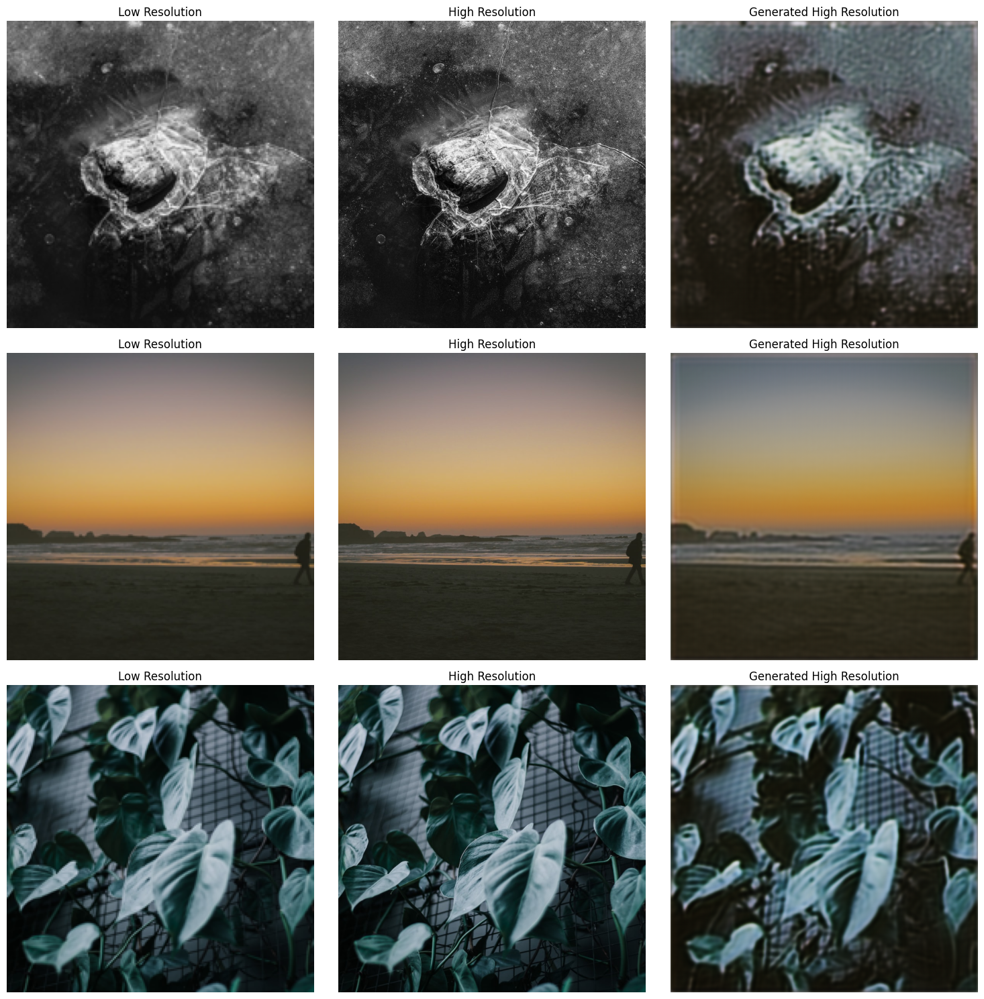

In [ ]:
 # Visualize the images
 visualize_images(validation_loader, netG)

<br>

### *Testing the Second Epoch Training*

In [45]:
if __name__ == "__main__":
    additional_epochs = NUMBER_OF_EPOCHS[1]          # Additional epochs to train the model
    previous_epoch = total_epochs

    # Paths to the checkpoints
    last_epoch = previous_epoch  # Set this to the last epoch you trained till

    gen_checkpoint_path = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {last_epoch}.pth"
    disc_checkpoint_path = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {last_epoch}.pth"

    # Load the checkpoints
    model_manager.load_checkpoints(gen_checkpoint_path, disc_checkpoint_path)

    # Define the number of additional epochs to continue training
    start_epoch = last_epoch + 1
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        additional_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

=> Loading Checkpoints...



[Epoch 2/2] - Discriminator Loss: 0.9819 | Generator Loss: 0.0120 | D(x): 0.4452 | D(G(z)): 0.4073: 100%|██████████| 161/161 [00:24<00:00,  6.46it/s]
Converting and Validating Low-Resolution Images to Super-Resolution Images - PSNR: 21.4517 dB | SSIM: 0.3615: 100%|██████████| 100/100 [00:03<00:00, 27.15it/s]


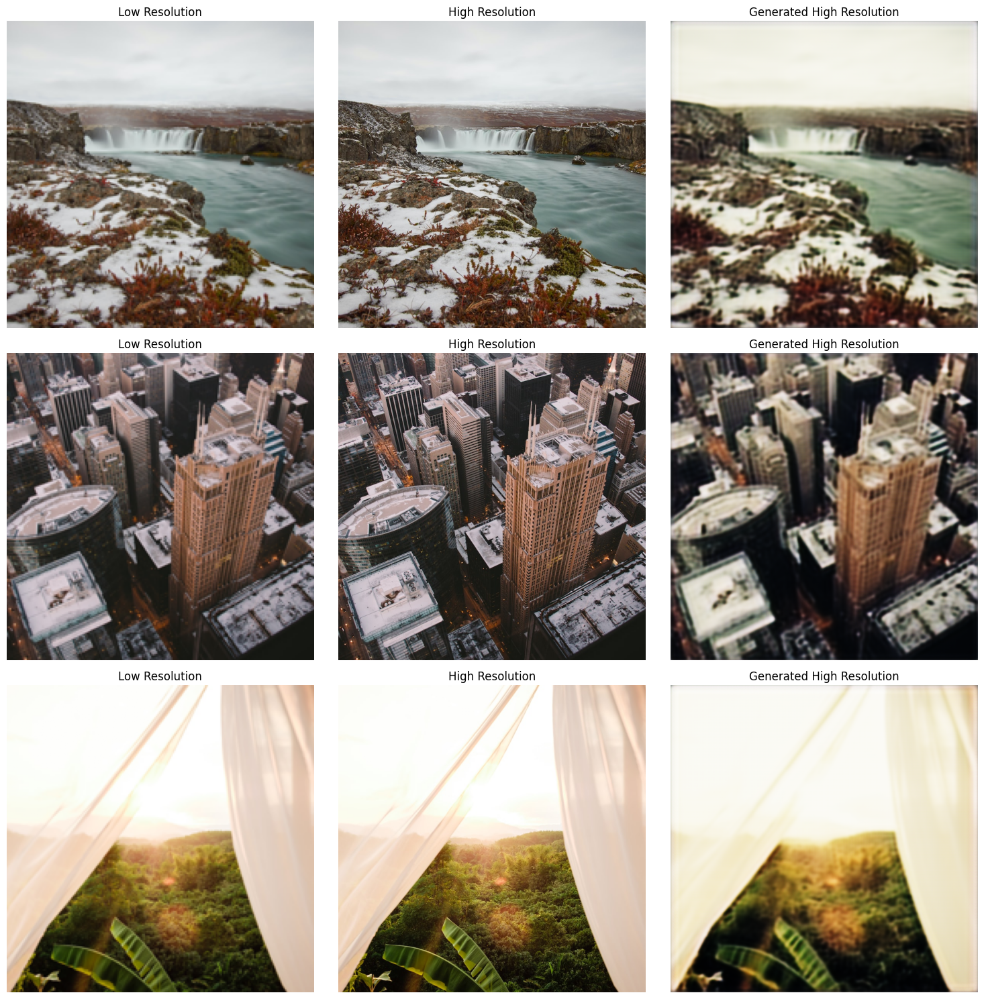

In [46]:
 # Visualize the images
 visualize_images(validation_loader, netG)

<br>

### *Testing the Third Epoch Training*

In [ ]:
if __name__ == "__main__":
    additional_epochs = NUMBER_OF_EPOCHS[2]          # Additional epochs to train the model
    previous_epoch = total_epochs

    # Paths to the checkpoints
    last_epoch = previous_epoch  # Set this to the last epoch you trained till

    gen_checkpoint_path = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {last_epoch}.pth"
    disc_checkpoint_path = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {last_epoch}.pth"

    # Load the checkpoints
    model_manager.load_checkpoints(gen_checkpoint_path, disc_checkpoint_path)

    # Define the number of additional epochs to continue training
    start_epoch = last_epoch + 1
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        additional_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

In [ ]:
 # Visualize the images
 visualize_images(validation_loader, netG)

<br>

### *Testing the Fourth Epoch Training*

In [ ]:
if __name__ == "__main__":
    additional_epochs = NUMBER_OF_EPOCHS[3]          # Additional epochs to train the model
    previous_epoch = total_epochs

    # Paths to the checkpoints
    last_epoch = previous_epoch  # Set this to the last epoch you trained till

    gen_checkpoint_path = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {last_epoch}.pth"
    disc_checkpoint_path = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {last_epoch}.pth"

    # Load the checkpoints
    model_manager.load_checkpoints(gen_checkpoint_path, disc_checkpoint_path)

    # Define the number of additional epochs to continue training
    start_epoch = last_epoch + 1
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        additional_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

In [ ]:
 # Visualize the images
 visualize_images(validation_loader, netG)

<br>

### *Testing the Fifth Epoch Training*

In [ ]:
if __name__ == "__main__":
    additional_epochs = NUMBER_OF_EPOCHS[4]          # Additional epochs to train the model
    previous_epoch = total_epochs

    # Paths to the checkpoints
    last_epoch = previous_epoch  # Set this to the last epoch you trained till

    gen_checkpoint_path = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {last_epoch}.pth"
    disc_checkpoint_path = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {last_epoch}.pth"

    # Load the checkpoints
    model_manager.load_checkpoints(gen_checkpoint_path, disc_checkpoint_path)

    # Define the number of additional epochs to continue training
    start_epoch = last_epoch + 1
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        additional_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

In [ ]:
 # Visualize the images
 visualize_images(validation_loader, netG)

<br>

### *Testing the Last Epoch Training*

In [ ]:
if __name__ == "__main__":
    additional_epochs = NUMBER_OF_EPOCHS[5]          # Additional epochs to train the model
    previous_epoch = total_epochs

    # Paths to the checkpoints
    last_epoch = previous_epoch  # Set this to the last epoch you trained till

    gen_checkpoint_path = CHECKPOINT_GENERATOR_WEIGHTS + f"Generator Epoch {last_epoch}.pth"
    disc_checkpoint_path = CHECKPOINT_DISCRIMINATOR_WEIGHTS + f"Discriminator Epoch {last_epoch}.pth"

    # Load the checkpoints
    model_manager.load_checkpoints(gen_checkpoint_path, disc_checkpoint_path)

    # Define the number of additional epochs to continue training
    start_epoch = last_epoch + 1
    total_epochs = last_epoch + additional_epochs

    # Initialize training manager
    training_manager = TrainingManager(
        model_manager,
        train_loader,
        valid_loader,
        additional_epochs,
        start_epoch=start_epoch,
    )

    training_manager.train()

In [ ]:
 # Visualize the images
 visualize_images(validation_loader, netG)